##### Libraries required 

In [15]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
import matplotlib.pyplot as plt
from sklearn import tree

In [2]:
url = "https://raw.githubusercontent.com/uiuc-cse/data-fa14/gh-pages/data/iris.csv"
data = pd.read_csv(url)

In [3]:
# Feature and Target
X = data.drop("species", axis =1)
y = data["species"]


In [4]:
# Split the Datasets
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2,random_state= 42)

In [5]:
# Create Random Forest Model

model = RandomForestClassifier(n_estimators= 100 , random_state=42)



In [7]:
# Train the Model

model.fit(X_train,y_train)

,n_estimators,100
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [8]:
# Predictions

y_pred = model.predict(X_test)


In [9]:
#Evaluation

print("Accuracy: ",accuracy_score(y_test,y_pred))
print("\nClassification Report : \n",classification_report(y_test,y_pred))

Accuracy:  1.0

Classification Report : 
               precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        10
  versicolor       1.00      1.00      1.00         9
   virginica       1.00      1.00      1.00        11

    accuracy                           1.00        30
   macro avg       1.00      1.00      1.00        30
weighted avg       1.00      1.00      1.00        30



In [12]:
# Feature importance 

importances = model.feature_importances_
for feature, importance in zip(X.columns,importances):
    print(f"{feature}: {importance}")

sepal_length: 0.10809762464246378
sepal_width: 0.030386812473242528
petal_length: 0.43999397414456937
petal_width: 0.4215215887397244



Plotting Trees


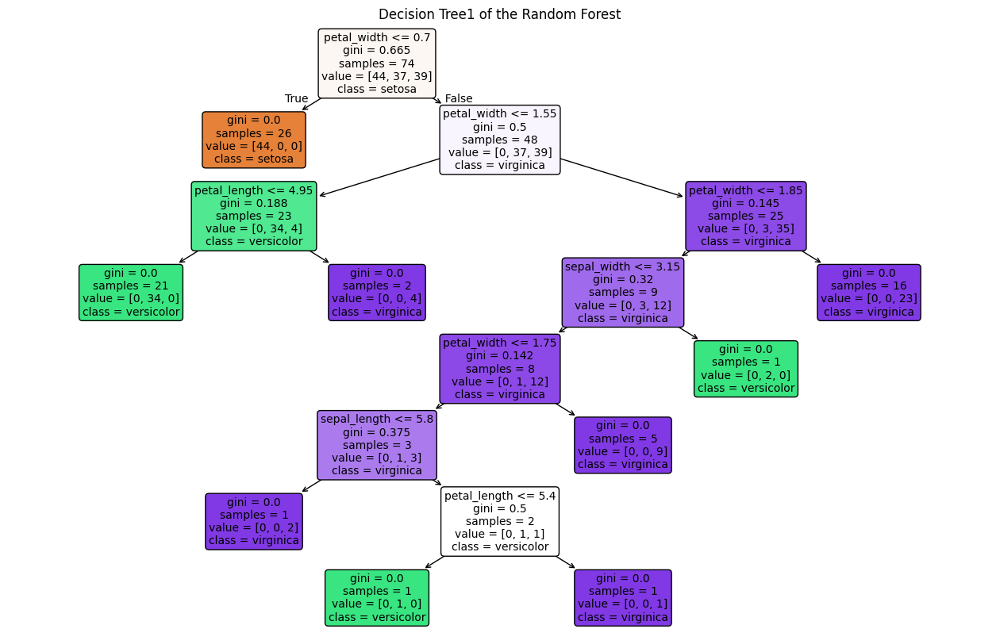

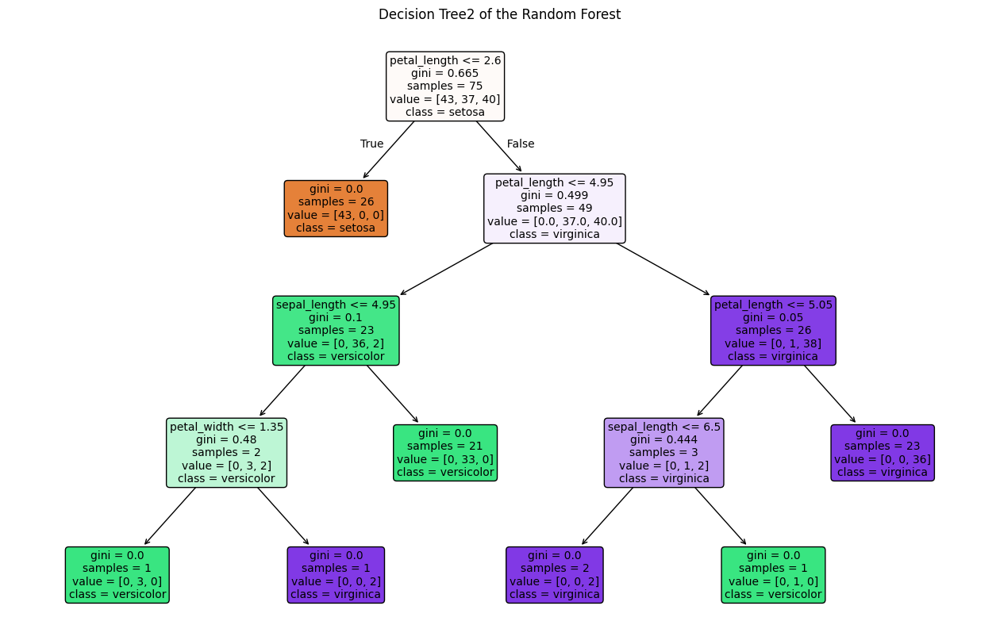

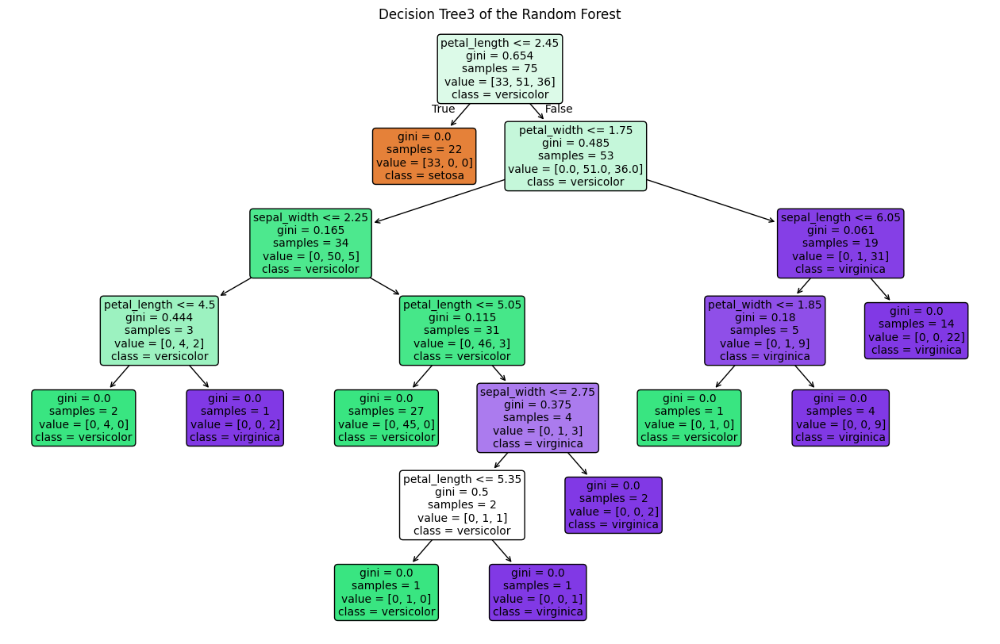

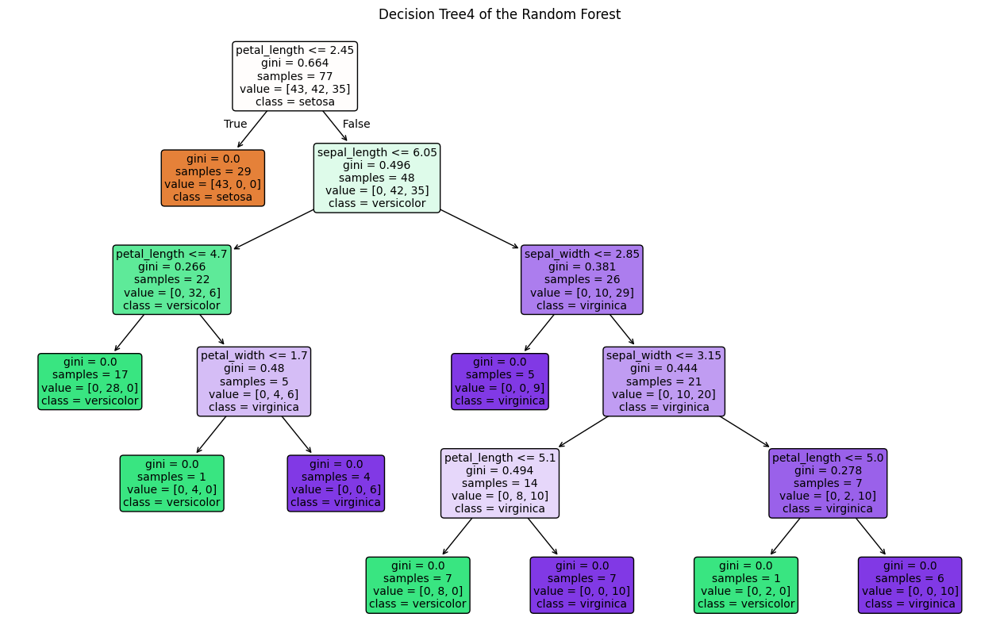

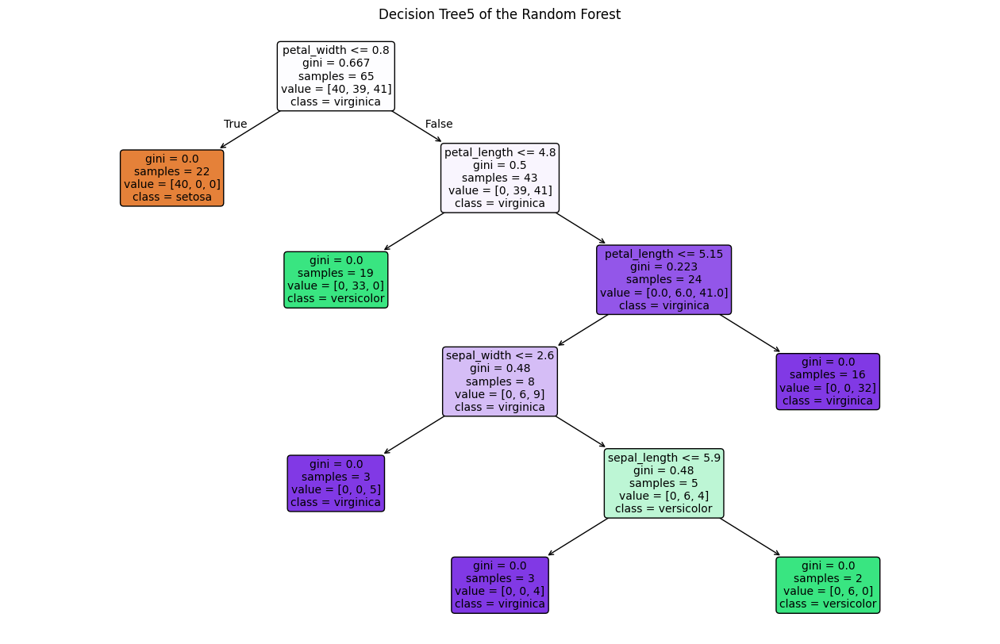

...

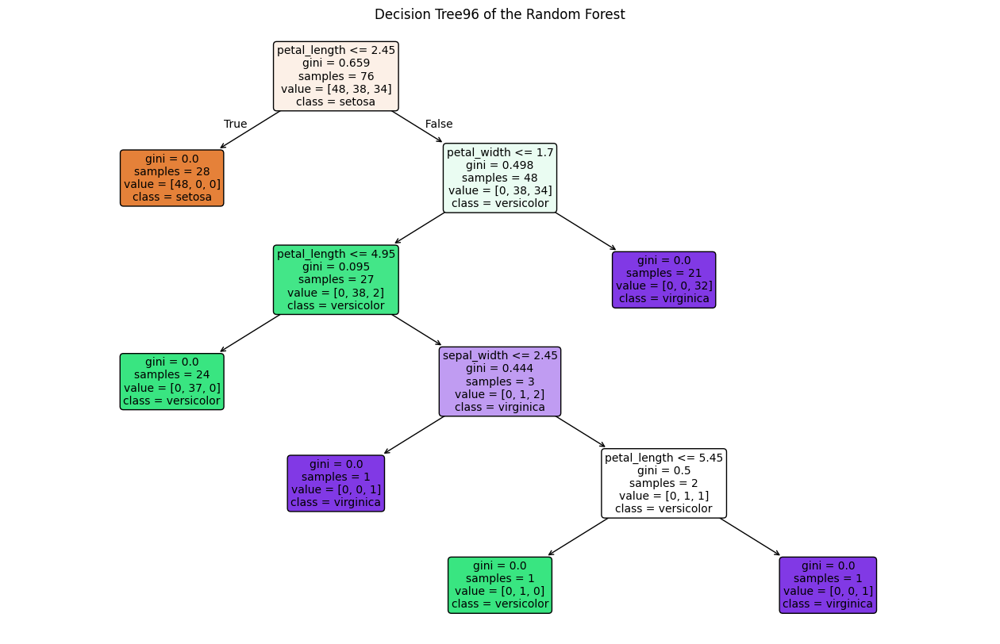

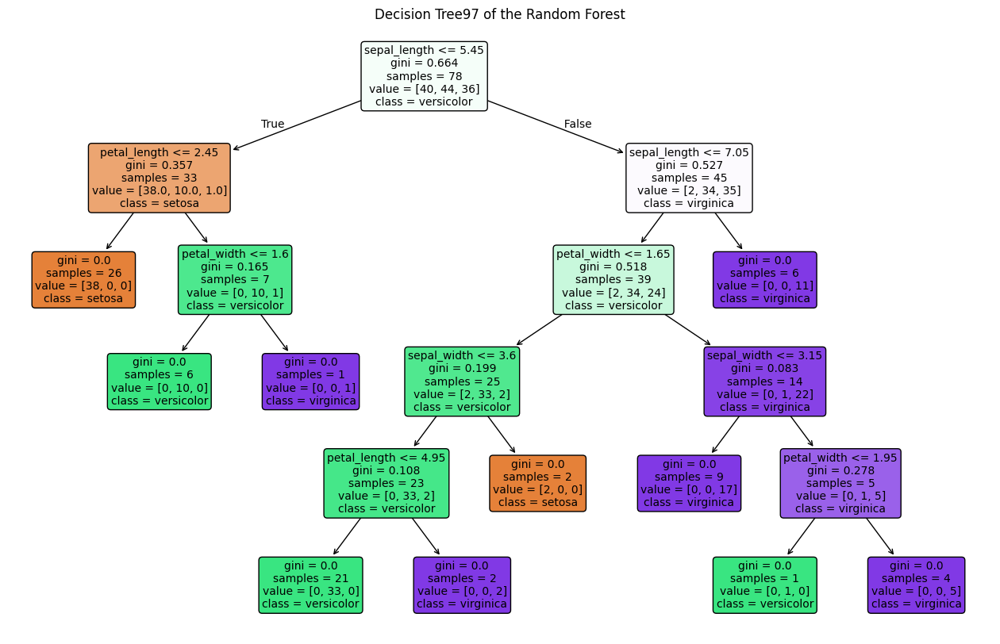

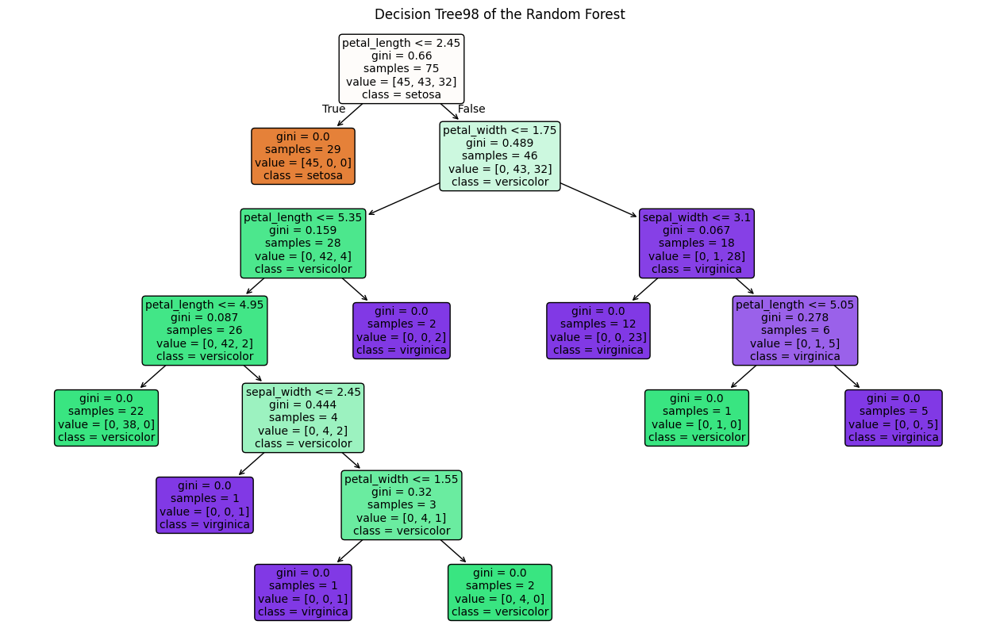

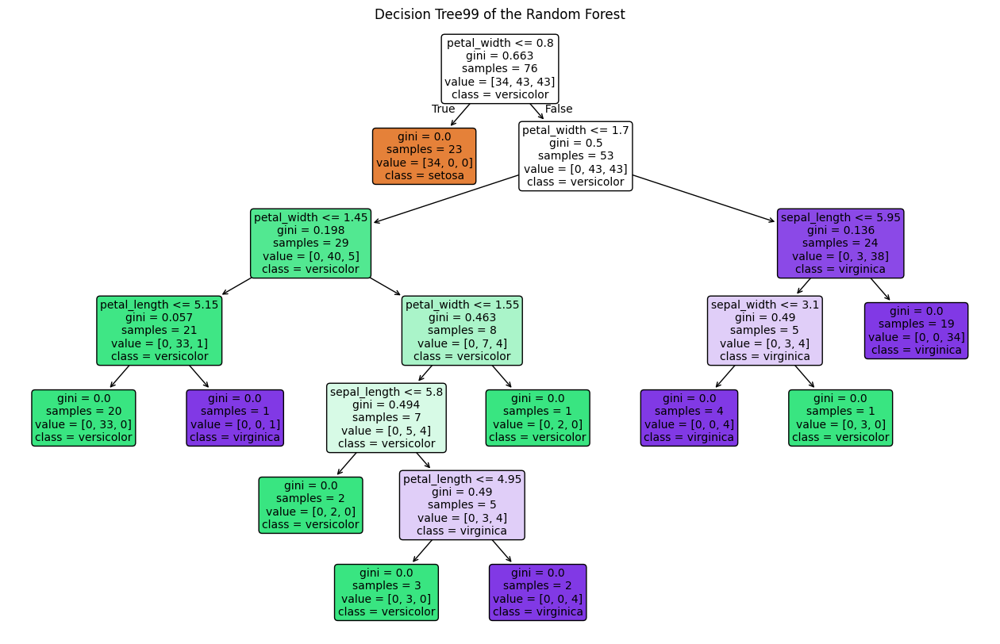

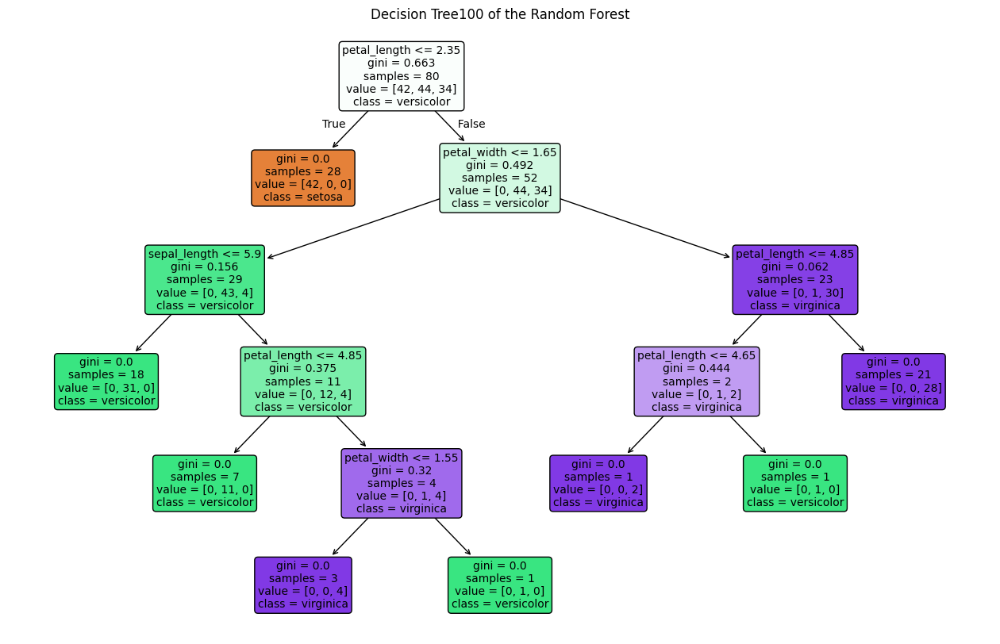

In [17]:
# Plotting the trees 
print("\nPlotting Trees")

for i , estimator in enumerate(model.estimators_):
    plt.figure(figsize=(16,10))
    tree.plot_tree(
        estimator,
        feature_names=X.columns,
        class_names= model.classes_,
        filled = True,
        rounded= True,
        fontsize = 10
    )
    plt.title(f"Decision Tree{i+1} of the Random Forest")
    plt.show()